In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df=pd.read_csv("/content/train .csv", index_col=0)
df.head(20)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1460 entries, 1 to 1460
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   MSZoning       1460 non-null   object 
 2   LotFrontage    1201 non-null   float64
 3   LotArea        1460 non-null   int64  
 4   Street         1460 non-null   object 
 5   Alley          91 non-null     object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuilt    

In [ ]:
df.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [ ]:
df.isnull().sum()

,0
MSSubClass,0
MSZoning,0
LotFrontage,259
LotArea,0
Street,0
...,...
MoSold,0
YrSold,0
SaleType,0
SaleCondition,0


In [ ]:
df["LotFrontage"]=df["LotFrontage"].fillna(df["LotFrontage"].mean())

In [ ]:
df.isnull().sum()

,0
MSSubClass,0
MSZoning,0
LotFrontage,0
LotArea,0
Street,0
...,...
MoSold,0
YrSold,0
SaleType,0
SaleCondition,0


In [ ]:
sns.pairplot(df)
plt.show()

In [ ]:
df=df.drop(["MSZoning"], axis=1)

In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df["Street"]=le.fit_transform(df["Street"])
df["Alley"]=le.fit_transform(df["Alley"])
df["LotShape"]=le.fit_transform(df["LotShape"])
df["LandContour"]=le.fit_transform(df["LandContour"])
df["Utilities"]=le.fit_transform(df["Utilities"])
df["LotConfig"]=le.fit_transform(df["LotConfig"])
df["LandSlope"]=le.fit_transform(df["LandSlope"])
df["Neighborhood"]=le.fit_transform(df["Neighborhood"])
df["Condition1"]=le.fit_transform(df["Condition1"])
df["Condition2"]=le.fit_transform(df["Condition2"])
df["BldgType"]=le.fit_transform(df["BldgType"])
df["HouseStyle"]=le.fit_transform(df["HouseStyle"])
df["RoofStyle"]=le.fit_transform(df["RoofStyle"])
df["RoofMatl"]=le.fit_transform(df["RoofMatl"])
df["Exterior1st"]=le.fit_transform(df["Exterior1st"])
df["Exterior2nd"]=le.fit_transform(df["Exterior2nd"])
df["MasVnrType"]=le.fit_transform(df["MasVnrType"])
df["ExterQual"]=le.fit_transform(df["ExterQual"])
df["ExterCond"]=le.fit_transform(df["ExterCond"])
df["Foundation"]=le.fit_transform(df["Foundation"])
df["BsmtQual"]=le.fit_transform(df["BsmtQual"])
df["BsmtCond"]=le.fit_transform(df["BsmtCond"])
df["BsmtExposure"]=le.fit_transform(df["BsmtExposure"])
df["BsmtFinType1"]=le.fit_transform(df["BsmtFinType1"])
df["BsmtFinType2"]=le.fit_transform(df["BsmtFinType2"])
df["Heating"]=le.fit_transform(df["Heating"])
df["HeatingQC"]=le.fit_transform(df["HeatingQC"])
df["CentralAir"]=le.fit_transform(df["CentralAir"])
df["Electrical"]=le.fit_transform(df["Electrical"])
df["KitchenQual"]=le.fit_transform(df["KitchenQual"])
df["Functional"]=le.fit_transform(df["Functional"])
df["FireplaceQu"]=le.fit_transform(df["FireplaceQu"])
df["GarageType"]=le.fit_transform(df["GarageType"])
df["GarageFinish"]=le.fit_transform(df["GarageFinish"])
df["GarageQual"]=le.fit_transform(df["GarageQual"])
df["GarageCond"]=le.fit_transform(df["GarageCond"])
df["PavedDrive"]=le.fit_transform(df["PavedDrive"])
df["SaleType"]=le.fit_transform(df["SaleType"])
df["SaleCondition"]=le.fit_transform(df["SaleCondition"])
df["MasVnrArea"]=df["MasVnrArea"].fillna(df["MasVnrArea"].mean())
df["BsmtFinSF1"]=df["BsmtFinSF1"].fillna(df["BsmtFinSF1"].mean())
df["BsmtFinSF2"]=df["BsmtFinSF2"].fillna(df["BsmtFinSF2"].mean())
df["BsmtUnfSF"]=df["BsmtUnfSF"].fillna(df["BsmtUnfSF"].mean())
df["TotalBsmtSF"]=df["TotalBsmtSF"].fillna(df["TotalBsmtSF"].mean())
df["BsmtFullBath"]=df["BsmtFullBath"].fillna(df["BsmtFullBath"].mean())
df["BsmtHalfBath"]=df["BsmtHalfBath"].fillna(df["BsmtHalfBath"].mean())
df["GarageYrBlt"]=df["GarageYrBlt"].fillna(df["GarageYrBlt"].mean())
df["GarageCars"]=df["GarageCars"].fillna(df["GarageCars"].mean())
df["GarageArea"]=df["GarageArea"].fillna(df["GarageArea"].mean())
df["LotFrontage"]=df["LotFrontage"].fillna(df["LotFrontage"].mean())
df["GarageArea"]=df["GarageArea"].fillna(df["GarageArea"].mean())
df["GarageCars"]=df["GarageCars"].fillna(df["GarageCars"].mean())
df["GarageYrBlt"]=df["GarageYrBlt"].fillna(df["GarageYrBlt"].mean())
df["BsmtFinSF1"]=df["BsmtFinSF1"].fillna(df["BsmtFinSF1"].mean())
df["BsmtFinSF2"]=df["BsmtFinSF2"].fillna(df["BsmtFinSF2"].mean())
df["BsmtUnfSF"]=df["BsmtUnfSF"].fillna(df["BsmtUnfSF"].mean())
df["TotalBsmtSF"]=df["TotalBsmtSF"].fillna(df["TotalBsmtSF"].mean())
df["BsmtFullBath"]=df["BsmtFullBath"].fillna(df["BsmtFullBath"].mean())
df["BsmtFinSF2"]=df["BsmtFinSF2"].fillna(df["BsmtFinSF2"].mean())
df["BsmtUnfSF"]=df["BsmtUnfSF"].fillna(df["BsmtUnfSF"].mean())
df["TotalBsmtSF"]=df["TotalBsmtSF"].fillna(df["TotalBsmtSF"].mean())
df["BsmtFullBath"]=df["BsmtFullBath"].fillna(df["BsmtFullBath"].mean())
df["BsmtHalfBath"]=df["BsmtHalfBath"].fillna(df["BsmtHalfBath"].mean())
df["BsmtFinSF1"]=df["BsmtFinSF1"].fillna(df["BsmtFinSF1"].mean())
df["BsmtFinSF2"]=df["BsmtFinSF2"].fillna(df["BsmtFinSF2"].mean())
df["BsmtUnfSF"]=df["BsmtUnfSF"].fillna(df["BsmtUnfSF"].mean())
df["TotalBsmtSF"]=df["TotalBsmtSF"].fillna(df["TotalBsmtSF"].mean())


In [ ]:
df.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,1,2,3,3,0,4,...,0,NaN,NaN,NaN,0,2,2008,8,4,208500
2,20,RL,80.0,9600,1,2,3,3,0,2,...,0,NaN,NaN,NaN,0,5,2007,8,4,181500
3,60,RL,68.0,11250,1,2,0,3,0,4,...,0,NaN,NaN,NaN,0,9,2008,8,4,223500
4,70,RL,60.0,9550,1,2,0,3,0,0,...,0,NaN,NaN,NaN,0,2,2006,8,0,140000
5,60,RL,84.0,14260,1,2,0,3,0,2,...,0,NaN,NaN,NaN,0,12,2008,8,4,250000


In [ ]:
df.head()

,MSSubClass,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,65.0,8450,1,2,3,3,0,4,0,...,0,NaN,NaN,NaN,0,2,2008,8,4,208500
2,20,80.0,9600,1,2,3,3,0,2,0,...,0,NaN,NaN,NaN,0,5,2007,8,4,181500
3,60,68.0,11250,1,2,0,3,0,4,0,...,0,NaN,NaN,NaN,0,9,2008,8,4,223500
4,70,60.0,9550,1,2,0,3,0,0,0,...,0,NaN,NaN,NaN,0,2,2006,8,0,140000
5,60,84.0,14260,1,2,0,3,0,2,0,...,0,NaN,NaN,NaN,0,12,2008,8,4,250000


In [ ]:
X=df[["MSSubClass","LotFrontage","LotArea"]]

In [ ]:
y=df["SalePrice"]

In [ ]:
from sklearn.linear_model import LinearRegression
lr=LinearRegression()
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)
from sklearn.metrics import r2_score


In [ ]:
lr.fit(X_train,y_train)

LinearRegression()

In [ ]:
y_pred=lr.predict(X_test)

In [ ]:
r2_score(y_test,y_pred)

0.17078648160121612

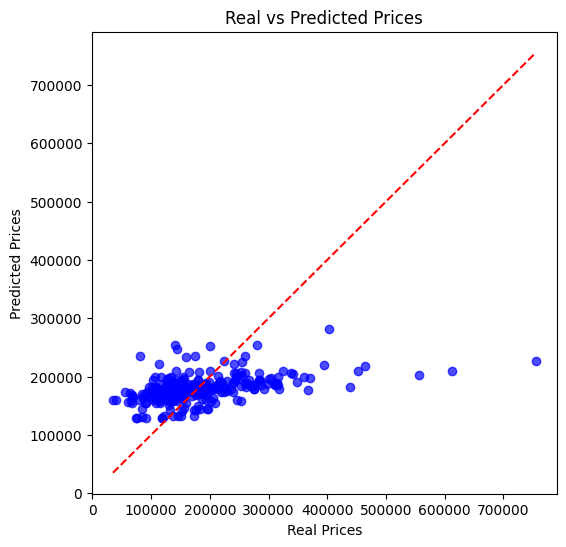

In [ ]:
plt.figure(figsize=(6,6))
plt.scatter(y_test, y_pred, color="blue", alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Real Prices")
plt.ylabel("Predicted Prices")
plt.title("Real vs Predicted Prices")
plt.show()


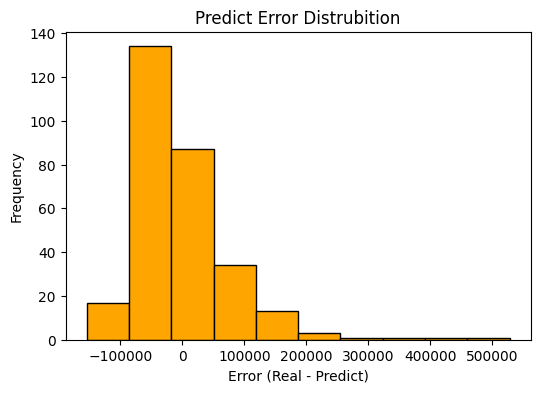

In [ ]:
errors = y_test - y_pred

plt.figure(figsize=(6,4))
plt.hist(errors, bins=10, color="orange", edgecolor="black")
plt.title("Predict Error Distrubition")
plt.xlabel("Error (Real - Predict)")
plt.ylabel("Frequency")
plt.show()
